Mounting Drive:

In [1]:
# Mount Google Drive (if dataset is stored there)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Dependencies:

In [2]:
!pip install tensorflow opencv-python matplotlib

In [5]:
import os
image_dir = "/content/drive/MyDrive/Projects/archive/images"
print("Total files:", len(os.listdir(image_dir)))
print("Sample files:", os.listdir(image_dir)[:5])

Total files: 853
Sample files: ['maksssksksss115.png', 'maksssksksss113.png', 'maksssksksss108.png', 'maksssksksss118.png', 'maksssksksss105.png']


Data Pre-processing:


In [7]:
import os
import cv2
import numpy as np
import xml.etree.ElementTree as ET
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import img_to_array

# Paths to image and annotation directories
image_dir = "/content/drive/MyDrive/Projects/archive/images"
annot_dir = "/content/drive/MyDrive/Projects/archive/annotations"

# Class label map
label_map = {
    'with_mask': 0,
    'without_mask': 1,
    'mask_weared_incorrect': 2
}

data = []
labels = []

# Loop through all annotation files
for xml_file in os.listdir(annot_dir):
    if not xml_file.endswith('.xml'):
        continue

    xml_path = os.path.join(annot_dir, xml_file)
    tree = ET.parse(xml_path)
    root = tree.getroot()

    filename = root.find('filename').text
    image_path = os.path.join(image_dir, filename)

    image = cv2.imread(image_path)
    if image is None:
        continue

    # Resize image
    image = cv2.resize(image, (128, 128))
    image = img_to_array(image)

    # Use first object label in XML (assumes one label per image)
    label = root.find('object').find('name').text
    if label not in label_map:
        continue

    data.append(image)
    labels.append(label_map[label])

# Convert to numpy arrays
data = np.array(data, dtype="float") / 255.0
labels = to_categorical(np.array(labels), num_classes=3)

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(
    data, labels, test_size=0.2, stratify=labels, random_state=42
)

print(f"✅ Loaded {len(data)} samples.")
print(f"📊 Class distribution: {np.bincount(np.argmax(labels, axis=1))}")

✅ Loaded 853 samples.
📊 Class distribution: [698 119  36]


Transfer Learning:

In [10]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D, Dropout, Flatten, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

INIT_LR = 1e-4
EPOCHS = 10
BS = 32
IMAGE_SIZE = 224

# Preprocess data again if needed
X_train_resized = tf.image.resize(X_train, (IMAGE_SIZE, IMAGE_SIZE))
X_test_resized = tf.image.resize(X_test, (IMAGE_SIZE, IMAGE_SIZE))

# Base model
baseModel = MobileNetV2(weights="imagenet", include_top=False,
                        input_tensor=Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))

# Head model
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten()(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(3, activation="softmax")(headModel)

model = Model(inputs=baseModel.input, outputs=headModel)

# Freeze base layers
for layer in baseModel.layers:
    layer.trainable = False

# Compile
opt = Adam(learning_rate=INIT_LR)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
model.summary()


/tmp/ipython-input-10-745689898.py:18: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  baseModel = MobileNetV2(weights="imagenet", include_top=False,


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Data Augmentation for Accuracy

In [11]:
aug = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

Train Model

In [12]:
H = model.fit(
    aug.flow(X_train_resized, y_train, batch_size=BS),
    steps_per_epoch=len(X_train_resized) // BS,
    validation_data=(X_test_resized, y_test),
    validation_steps=len(X_test_resized) // BS,
    epochs=EPOCHS
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 224, 224, 3))
  warnings.warn(msg)


21/21 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.3966 - loss: 1.6276 - val_accuracy: 0.8187 - val_loss: 0.7121
Epoch 2/10
 1/21 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.8438 - loss: 0.6418

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


21/21 ━━━━━━━━━━━━━━━━━━━━ 12s 514ms/step - accuracy: 0.8438 - loss: 0.6418 - val_accuracy: 0.8187 - val_loss: 0.7101
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - accuracy: 0.7718 - loss: 0.7601 - val_accuracy: 0.8129 - val_loss: 0.6246
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 12s 513ms/step - accuracy: 0.6875 - loss: 0.6941 - val_accuracy: 0.8129 - val_loss: 0.6216
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.7719 - loss: 0.7421 - val_accuracy: 0.8129 - val_loss: 0.5799
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 11s 513ms/step - accuracy: 0.8438 - loss: 0.5579 - val_accuracy: 0.8129 - val_loss: 0.5787
Epoch 7/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.7732 - loss: 0.7037 - val_accuracy: 0.8129 - val_loss: 0.5624
Epoch 8/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 305ms/step - accuracy: 0.7188 - loss: 0.6158 - val_accuracy: 0.8129 - val_loss: 0.5625
Epoch 9/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.7913 - loss: 0.6461 - val_accuracy: 0.8246 - val_loss:

Save the Trained Mode

In [14]:
model.save("mask_detector_mobilenetv2.h5")
!cp mask_detector_mobilenetv2.h5 /content/drive/MyDrive/Projects/

static testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


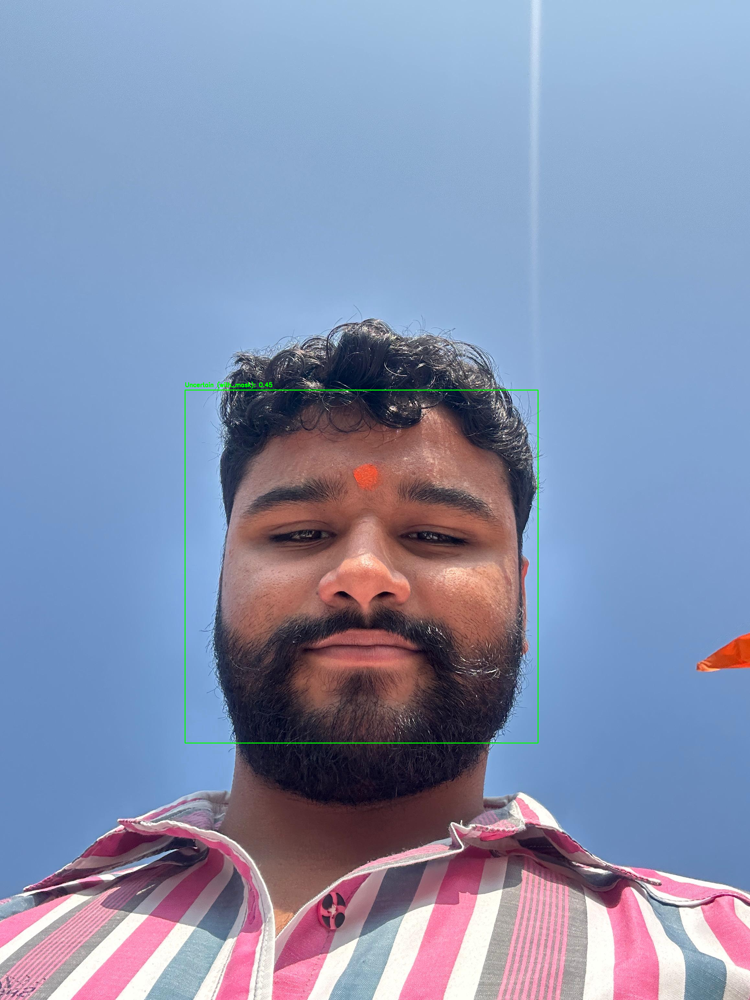

In [41]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from google.colab.patches import cv2_imshow

# Load the model and labels
model = load_model("/content/mask_detector_model.h5")
labels = ["with_mask", "without_mask", "mask_weared_incorrect"]

# Load the image
image_path = "/content/drive/MyDrive/Projects/test static/test_image.jpg"  # Replace with your image path
image = cv2.imread(image_path)
orig = image.copy()

# Load face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

# Convert to grayscale and detect faces
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# Loop over detected faces
for (x, y, w, h) in faces:
    face = image[y:y+h, x:x+w]

    # Preprocess the face for prediction
    face_resized = cv2.resize(face, (224, 224))
    face_array = img_to_array(face_resized)
    face_array = preprocess_input(face_array)
    face_array = np.expand_dims(face_array, axis=0)

    # Make prediction
    preds = model.predict(face_array)[0]
    label_idx = np.argmax(preds)
    label = labels[label_idx]
    confidence = preds[label_idx]

    # Change label if confidence is too low
    if confidence < 0.90:
        label = f"Uncertain ({label})"

    # Draw bounding box and label
    color = (0, 255, 0) if "with_mask" in label else (0, 0, 255)
    cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
    cv2.putText(image, f"{label}: {confidence:.2f}", (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Show the result in Colab
cv2_imshow(image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
✅ Processed: test_image.jpg


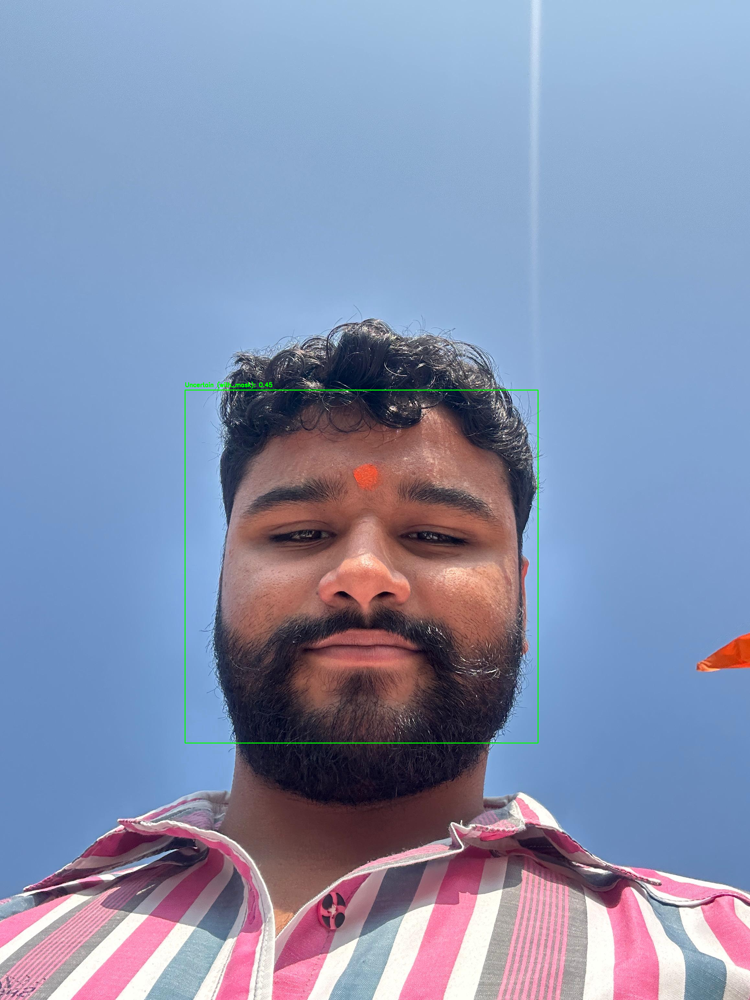

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
✅ Processed: WhatsApp Image 2025-07-17 at 00.49.08_02489b2c.jpg


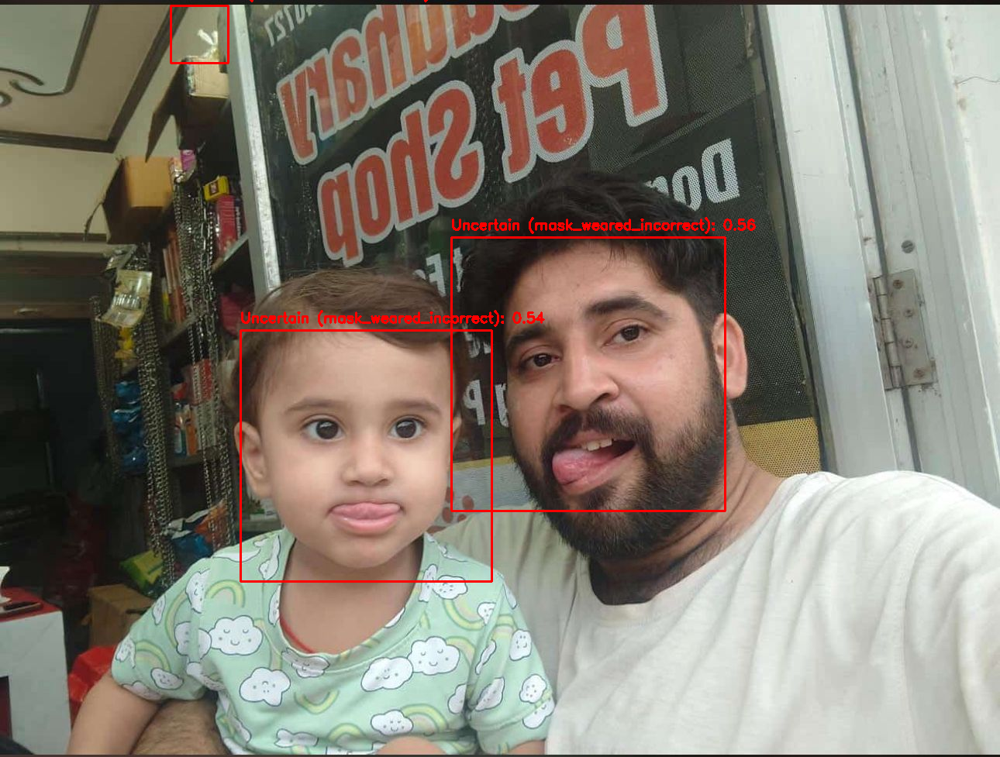

In [42]:
import cv2
import numpy as np
import os
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from google.colab.patches import cv2_imshow

# Load model and labels
model = load_model("/content/drive/MyDrive/Projects/mask_detector_model.h5")
labels = ["with_mask", "without_mask", "mask_weared_incorrect"]
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

# Folder path
folder_path = "/content/drive/MyDrive/Projects/test static"

# Loop through images
for file_name in os.listdir(folder_path):
    if not file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    image_path = os.path.join(folder_path, file_name)
    image = cv2.imread(image_path)
    if image is None:
        continue

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    for (x, y, w, h) in faces:
        face = image[y:y+h, x:x+w]
        face_resized = cv2.resize(face, (224, 224))
        face_array = img_to_array(face_resized)
        face_array = preprocess_input(face_array)
        face_array = np.expand_dims(face_array, axis=0)

        preds = model.predict(face_array)[0]
        label_idx = np.argmax(preds)
        label = labels[label_idx]
        confidence = preds[label_idx]

        if confidence < 0.90:
            label = f"Uncertain ({label})"

        color = (0, 255, 0) if "with_mask" in label else (0, 0, 255)
        cv2.rectangle(image, (x, y), (x+w, y+h), color, 2)
        cv2.putText(image, f"{label}: {confidence:.2f}", (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    print(f"✅ Processed: {file_name}")
    cv2_imshow(image)


In [21]:
print(f"Predicted: {label}, Confidence: {confidence:.2f}")

Predicted: Uncertain (with_mask), Confidence: 0.64


In [22]:
if confidence < 0.85:
    label = "uncertain"

In [27]:
import os
import xml.etree.ElementTree as ET
from collections import Counter

annotation_path = "/content/drive/MyDrive/Projects/archive/annotations"
label_counter = Counter()

for xml_file in os.listdir(annotation_path):
    if not xml_file.endswith(".xml"):
        continue

    tree = ET.parse(os.path.join(annotation_path, xml_file))
    root = tree.getroot()

    for obj in root.findall("object"):
        label = obj.find("name").text
        label_counter[label] += 1

print(label_counter)

Counter({'with_mask': 3232, 'without_mask': 717, 'mask_weared_incorrect': 123})


In [28]:
from sklearn.utils import class_weight
import numpy as np

# Convert one-hot back to class indices
y_integers = np.argmax(y_train, axis=1)

# Compute class weights
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_integers),
    y=y_integers
)

# Convert to dictionary
class_weights = dict(enumerate(class_weights))
print("Class Weights:", class_weights)


Class Weights: {0: np.float64(0.4074074074074074), 1: np.float64(2.3929824561403508), 2: np.float64(7.839080459770115)}


In [31]:
import numpy as np
import cv2
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D, Dropout, Flatten, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import class_weight
import tensorflow as tf

# Constants
INIT_LR = 1e-4
EPOCHS = 10
BS = 32
IMAGE_SIZE = 224

# 1. Resize using OpenCV to avoid tf.Tensor issues
X_train_resized = np.array([cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE)) for img in X_train])
X_test_resized = np.array([cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE)) for img in X_test])

# 2. Normalize (in case not already done)
X_train_resized = X_train_resized / 255.0
X_test_resized = X_test_resized / 255.0

# 3. Data Augmentation
aug = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

# 4. Compute class weights
y_integers = np.argmax(y_train, axis=1)
class_weights = class_weight.compute_class_weight(
    class_weight="balanced",
    classes=np.unique(y_integers),
    y=y_integers
)
class_weights = dict(enumerate(class_weights))
print("Class Weights:", class_weights)

# 5. Build MobileNetV2 model
baseModel = MobileNetV2(weights="imagenet", include_top=False,
                        input_tensor=Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))

headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten()(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(3, activation="softmax")(headModel)

model = Model(inputs=baseModel.input, outputs=headModel)

# Freeze base model
for layer in baseModel.layers:
    layer.trainable = False

# Compile model
opt = Adam(learning_rate=INIT_LR)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
model.summary()

# 6. Train with class weights
H = model.fit(
    aug.flow(X_train_resized, y_train, batch_size=BS),
    steps_per_epoch=len(X_train_resized) // BS,
    validation_data=(X_test_resized, y_test),
    validation_steps=len(X_test_resized) // BS,
    epochs=EPOCHS,
    class_weight=class_weights  # ✅ Balanced training
)


Class Weights: {0: np.float64(0.4074074074074074), 1: np.float64(2.3929824561403508), 2: np.float64(7.839080459770115)}


/tmp/ipython-input-31-3007331041.py:47: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  baseModel = MobileNetV2(weights="imagenet", include_top=False,


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_2115']
Received: inputs=Tensor(shape=(None, 224, 224, 3))
  warnings.warn(msg)


21/21 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.3087 - loss: 1.3928 - val_accuracy: 0.8187 - val_loss: 0.9131
Epoch 2/10
 1/21 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.4062 - loss: 1.3783

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


21/21 ━━━━━━━━━━━━━━━━━━━━ 11s 513ms/step - accuracy: 0.4062 - loss: 1.3783 - val_accuracy: 0.8187 - val_loss: 0.9205
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.4433 - loss: 1.2471 - val_accuracy: 0.8187 - val_loss: 1.0248
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 11s 513ms/step - accuracy: 0.3438 - loss: 0.9861 - val_accuracy: 0.8187 - val_loss: 1.0421
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - accuracy: 0.3959 - loss: 1.1560 - val_accuracy: 0.0643 - val_loss: 1.1104
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 8s 311ms/step - accuracy: 0.1875 - loss: 2.3412 - val_accuracy: 0.0760 - val_loss: 1.1397
Epoch 7/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.2531 - loss: 1.2017 - val_accuracy: 0.0409 - val_loss: 1.1370
Epoch 8/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 12s 514ms/step - accuracy: 0.3438 - loss: 0.9675 - val_accuracy: 0.0409 - val_loss: 1.1219
Epoch 9/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.3206 - loss: 1.2658 - val_accuracy: 0.0409 - val_loss:

In [32]:
model.save("mask_detector_model.h5")